# Restricted Boltzmann Machines: Binary Visible Units and Mean-Field Approximation

## Abstract

This notebook implements and demonstrates Restricted Boltzmann Machines (RBMs) with binary visible units, including a mean-field variant. RBMs are generative models that learn to represent data distributions through unsupervised learning. We explore training on datasets like MNIST, CIFAR-10, and STL-10 using Contrastive Divergence (CD) and Persistent Contrastive Divergence (PCD) algorithms.

## Authors

Kai Zhang and Sora Sakai, Department of Chemistry and Biochemistry, The University of Texas at Tyler, 2025

## References

- MNIST dataset: http://yann.lecun.com/, https://www.nist.gov/itl/products-and-services/emnist-dataset
- CIFAR-10 dataset: https://www.cs.toronto.edu/~kriz/cifar.html
- STL-10 dataset: https://ai.stanford.edu/~acoates/stl10/

## Optimal/Close-to-optimal Training Hyperparameters

| Dataset | Split | n_hidden | n_epochs | lr | CD/PCD | k (MC steps) | Update | Generation | Comments |
|:--------|:------|:---------|:---------|:---|:-------|:-------------|:-------|:-----------|:---------|
| MNIST (binarized) | training | 256 | 100 | 0.05 | PCD | 10 | - | k>100 good | - |
| MNIST (unbinarized) | training | 256 | 100 | 0.05 | PCD | 10 | - | k>100 | - |
| MNIST (unbinarized) | training | 256 | 500 | 0.01 | PCD | 10 | - | k~1000 | - |
| MNIST (unbinarized) | training | 256 | 500 | 0.01 | CD | 10 | - | k~1000 OK but wrong | E_diff=4.2; MSE=0.0083 |
| MNIST (unbinarized) | training | 256 | 1000 | 0.0001 | PCD | 10 | Langevin (0.05) absorb | k~1000 some features, but not good | Without W clamp, Epoch 1000/1000, E_data: -2281.1949, E_model: -2198.8888, E_diff: 82.3061, mse: 0.0539; some filters collapse |
| CIFAR-10 | training | 512 | 500 | 0.01 | PCD | 10 | - | PCD k>100 | - |
| CIFAR-10 | training | 512 | 1000 | 0.0001 | PCD | 10 | Gibbs | k~1000 better blocks | Learn better blocks, Epoch 1000/1000, E_data: -324.2352, E_model: -309.2918, E_diff: 14.9434, mse: 0.0226 |
| CIFAR-10 | training | 512 | 1000 | 0.0001 | PCD | 10 | Langevin (0.05) absorb | k~1000 some features | Reconstruction learns blocks, Epoch 1000/1000, E_data: -460.4805, E_model: -431.3506, E_diff: 29.1299, mse: 0.0453 |
| CIFAR-10 | training | 1024 | 500 | 0.01 | CD | 10 | - | CD k>100 OK | - |
| STL-10 | unlabeled | 512 | 500 | 0.01 | PCD | 10 | - | PCD k>100 bad | - |
| Ising | training | 512 | 500 | 0.01 | PCD | 10 | - | Good | - |

In [1]:
import os
from os import path

import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

In [2]:
# Check PyTorch GPU availability and set device

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("CUDA device count:", torch.cuda.device_count())

if torch.cuda.is_available():
    print("GPU device name:", torch.cuda.get_device_name(0))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

PyTorch version: 2.11.0+cu130
CUDA available: True
CUDA device count: 1
GPU device name: NVIDIA GeForce RTX 4090
Using device: cuda


# 1. Datasets -- use one of the four example datasets

In [3]:
# Define data directory path to where data is downloaded and/or stored.

data_dir = path.join("..", "data")

## 1.1 Load MNIST dataset from torchvision 
(comment out torch.round() to turn off binarization)

https://docs.pytorch.org/vision/main/generated/torchvision.datasets.MNIST.html

In [4]:
# Define data transformation: convert to tensor, flatten, and binarize
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.view(-1)),  # Flatten 28x28 -> 784
    transforms.Lambda(lambda x: torch.round(x))  # binarize decimals to 0,1; comment out this line if continuous values needed
])

# Load MNIST training and test datasets
train_data = datasets.MNIST(root=data_dir, train=True, transform=transform, download=True)
test_data = datasets.MNIST(root=data_dir, train=False, transform=transform, download=True)
print(train_data.data.size(),train_data.targets.size())
print(test_data.data.size(),test_data.targets.size())

# Create data loaders
train_loader = DataLoader(train_data, batch_size=64, shuffle=True, drop_last=True)
test_loader = DataLoader(test_data, batch_size=64, shuffle=True)

torch.Size([60000, 28, 28]) torch.Size([60000])
torch.Size([10000, 28, 28]) torch.Size([10000])


In [173]:
# Get a batch and inspect shapes

X_batch, y_batch = next(iter(test_loader))
print(X_batch.shape)
print(y_batch.shape)

torch.Size([64, 784])
torch.Size([64])


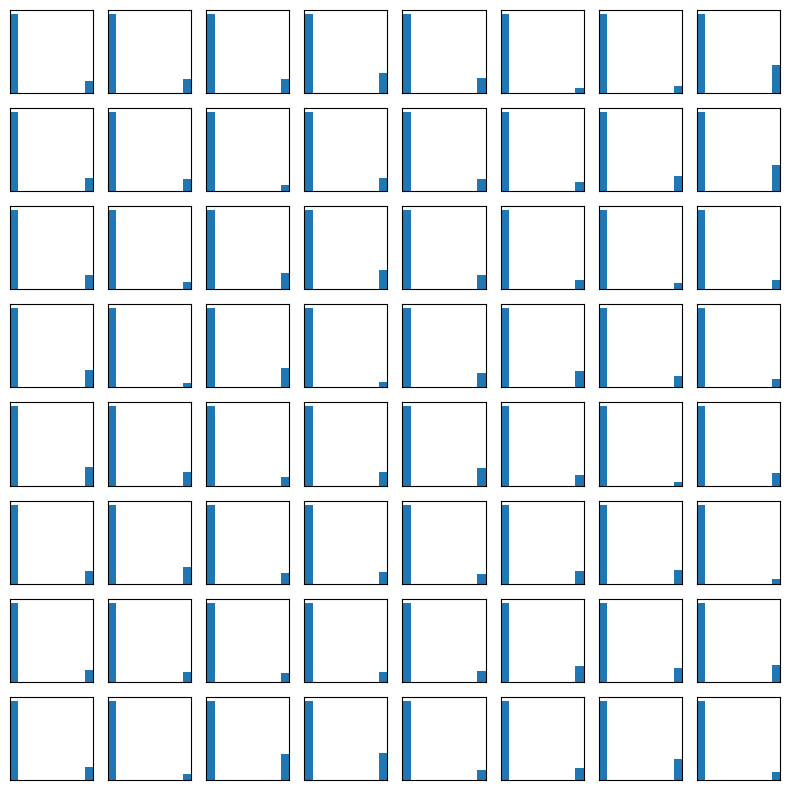

In [174]:
# See pixel distributions

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.hist(X_batch[i].cpu().view(-1)) 
    ax.set_xlim(0,1)
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

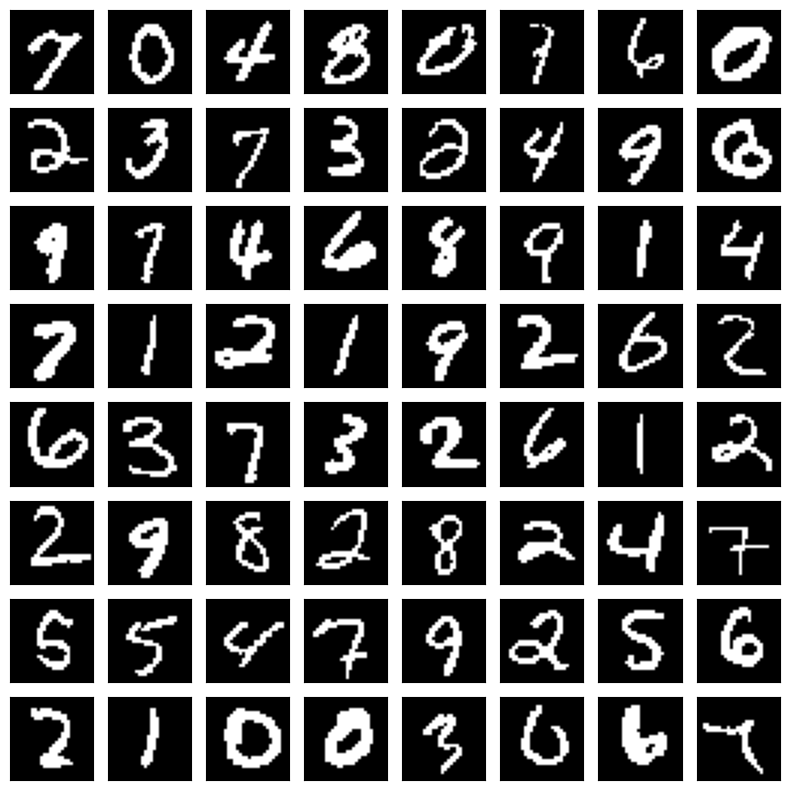

In [175]:
# See sample images

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.imshow(X_batch[i].cpu().view(28, 28), cmap="gray")
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

## 1.2 Load CIFAR10 dataset from torchvision

https://docs.pytorch.org/vision/main/generated/torchvision.datasets.CIFAR10.html

https://docs.pytorch.org/vision/0.9/datasets.html#cifar

In [447]:
# Define transformation for CIFAR-10: convert to grayscale, tensor, flatten, and optionally binarize (comment out binarization for continuous values)
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.view(-1)),  # Flatten 32x32 -> 1024
    # transforms.Lambda(lambda x: torch.round(x))
])

# Load CIFAR-10 training and test datasets
cifar_train = datasets.CIFAR10(root=data_dir, train=True, download=True, transform=transform)
cifar_test = datasets.CIFAR10(root=data_dir, train=False, download=True, transform=transform)
print("Train images:", len(cifar_train))
print("Test images:", len(cifar_test))

# Create data loaders for CIFAR-10
train_loader = DataLoader(cifar_train, batch_size=64, shuffle=True, drop_last = True)
test_loader = DataLoader(cifar_test, batch_size=64, shuffle=True)

Train images: 50000
Test images: 10000


In [448]:
# Get a batch and inspect shapes

X_batch, y_batch = next(iter(test_loader))
print(X_batch.shape)
print(y_batch.shape)

torch.Size([64, 1024])
torch.Size([64])


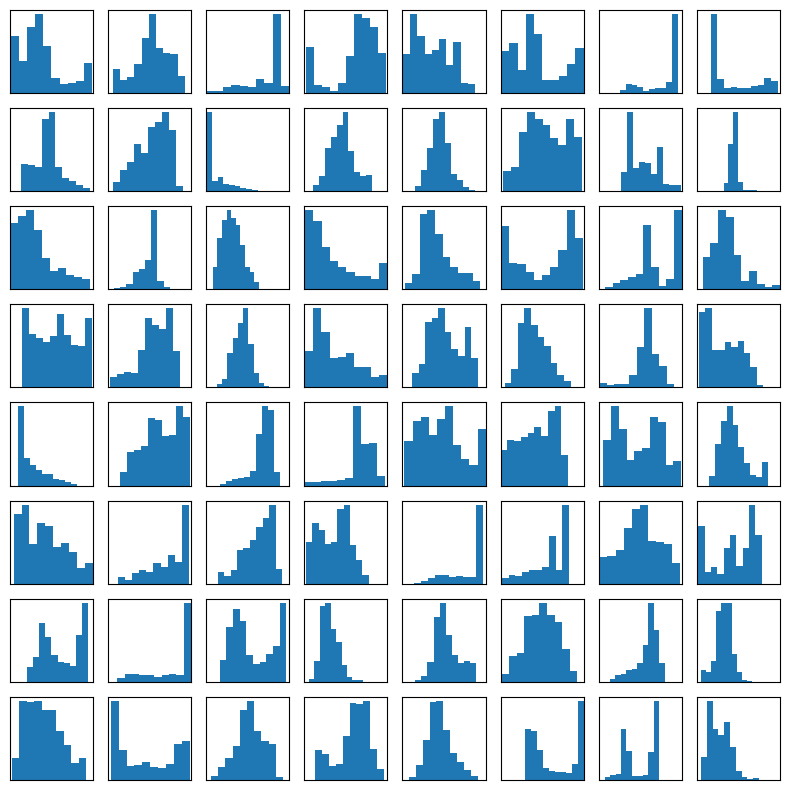

In [449]:
# See pixel distributions

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.hist(X_batch[i].cpu().view(-1)) 
    ax.set_xlim(0,1)
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

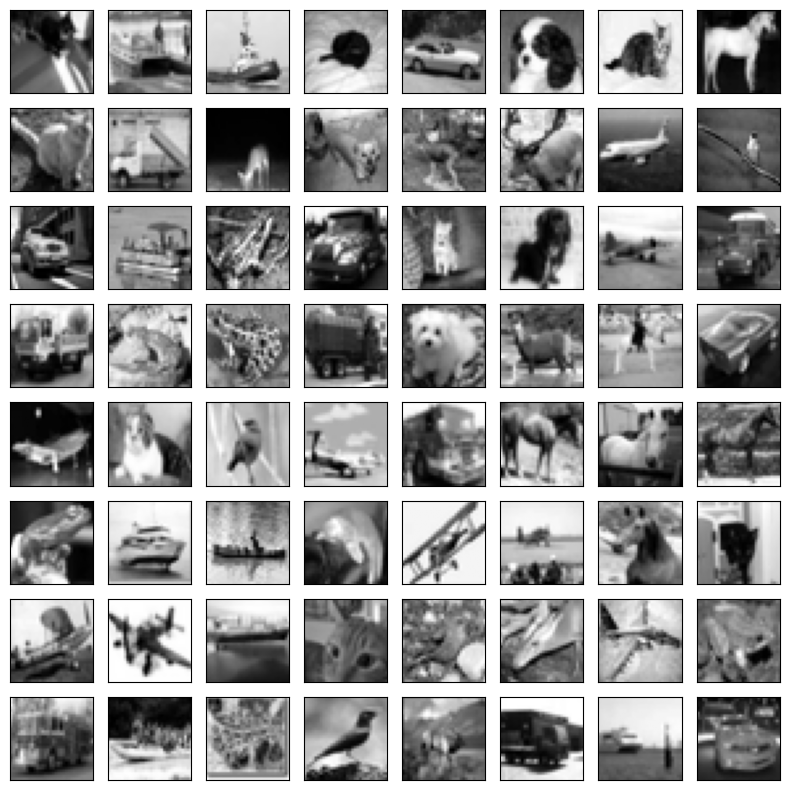

In [450]:
# See sample images

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.imshow(X_batch[i].cpu().view(32, 32), cmap="gray")
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

## 1.3 Load STL-10 dataset from torchvision

https://docs.pytorch.org/vision/main/generated/torchvision.datasets.STL10.html

In [47]:
# Define transformation for STL-10: grayscale, resize to 32x32, tensor, flatten
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),  # convert to grayscale
    transforms.Resize((32, 32), interpolation=transforms.InterpolationMode.BILINEAR),  # downsampling reduce size from 96x96 to 32x32
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.view(-1)),  # Flatten 32x32 -> 1024
])

# Load STL-10 datasets
stl10_train = datasets.STL10(root=data_dir, split='train', download=True, transform=transform) 
stl10_test = datasets.STL10(root=data_dir, split='test', download=True, transform=transform) 
stl10_unlabeled = datasets.STL10(root=data_dir, split='unlabeled', download=True, transform=transform)
print("Train images:", len(stl10_train))
print("Test images:", len(stl10_test))
print("Unlabeled images:", len(stl10_unlabeled))

# Create data loaders
train_loader = DataLoader(stl10_train, batch_size=64, shuffle=True, drop_last=True)
test_loader = DataLoader(stl10_test, batch_size=64, shuffle=True, drop_last=False)  # y = 0-9
unlabeled_loader = DataLoader(stl10_unlabeled, batch_size=64, shuffle=True, drop_last=False)  # y = -1

Train images: 5000
Test images: 8000
Unlabeled images: 100000


In [48]:
# Get a batch and inspect shapes

X_batch, y_batch = next(iter(test_loader))
print(X_batch.shape)
print(y_batch.shape)

torch.Size([64, 1024])
torch.Size([64])


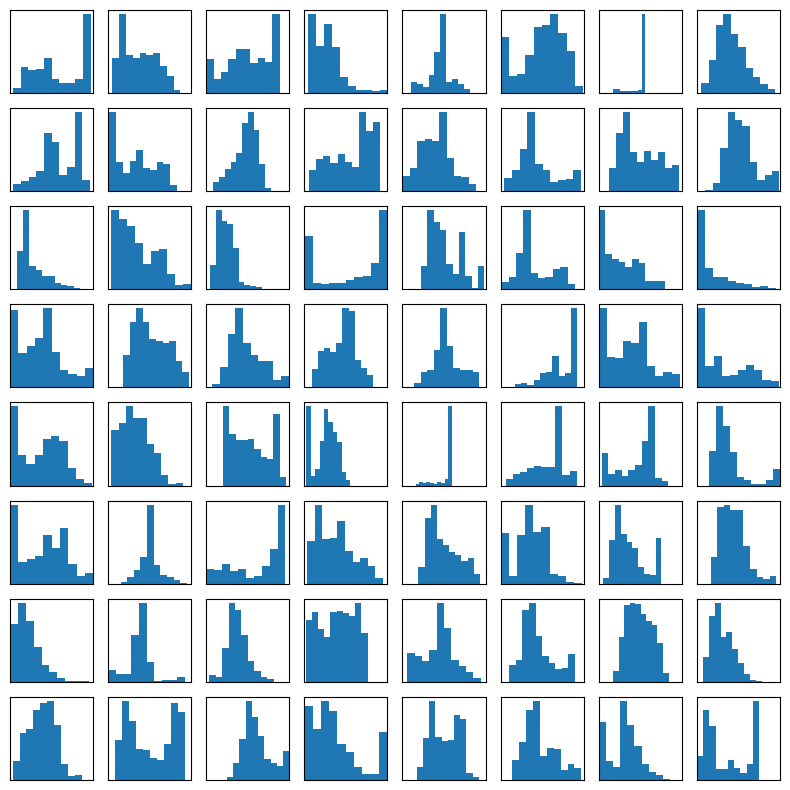

In [49]:
# See pixel distributions

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.hist(X_batch[i].cpu().view(-1)) 
    ax.set_xlim(0,1)
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
plt.show()

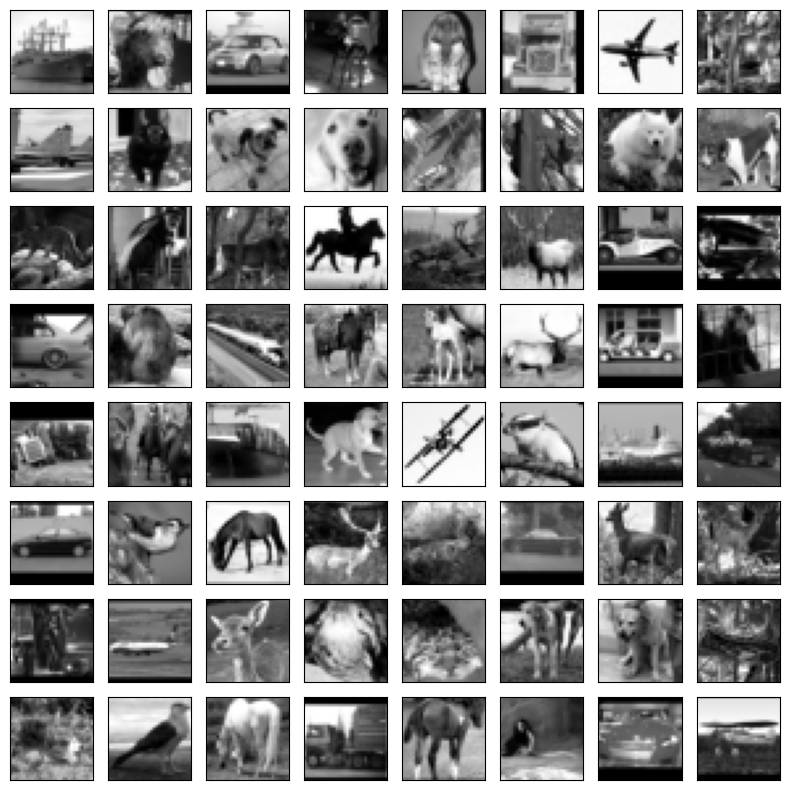

In [50]:
# See sample images

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8
    ax = fig.add_subplot(8, 8, i + 1)
    ax.imshow(X_batch[i].cpu().view(32, 32), cmap="gray")
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

## 1.4 Load Ising datasets
Download the ising dataset from: [![DOI](https://zenodo.org/badge/DOI/10.5281/zenodo.19712829.svg)](https://doi.org/10.5281/zenodo.19712829), and put it inside data_dir.

---
Allowed Values:

| L | T |
|:--:|:--:|
| 32 | 1.00 |
| 32 | 1.10 |
| 32 | 1.20 |
| 32 | 1.30 |
| 32 | 1.40 |
| 32 | 1.50 |
| 32 | 1.60 |
| 32 | 1.70 |
| 32 | 1.80 |
| 32 | 1.90 |
| 32 | 2.00 |
| 32 | 2.10 |
| 32 | 2.20 |
| 32 | 2.30 |
| 32 | 2.40 |
| 32 | 2.50 |
| 32 | 2.60 |
| 32 | 2.70 |
| 32 | 2.80 |
| 32 | 2.90 |
| 32 | 3.00 |

In [132]:
L = 32
T = 3.00

# Split ratio between train_data and test_data
split = 0.8

file_name = os.path.join(data_dir, f"2dIsing_L{L}", f"L{L}T{T:.2f}.npy")

dataset = np.load(file_name, allow_pickle=True)
dataset_tensor = torch.Tensor(dataset).float()
train_data, test_data = torch.split(dataset_tensor, int(len(dataset_tensor) * split))
print("Train shape: ", train_data.shape)
print("Test shape: ", test_data.shape)

train_loader = DataLoader(train_data, batch_size=64, shuffle=True, drop_last=True)
test_loader = DataLoader(test_data, batch_size=64, shuffle=True, drop_last=False)

Train shape:  torch.Size([16000, 1024])
Test shape:  torch.Size([4000, 1024])


In [133]:
# Get a batch and inspect shapes

X_batch = next(iter(test_loader))
print(X_batch.shape)

torch.Size([64, 1024])


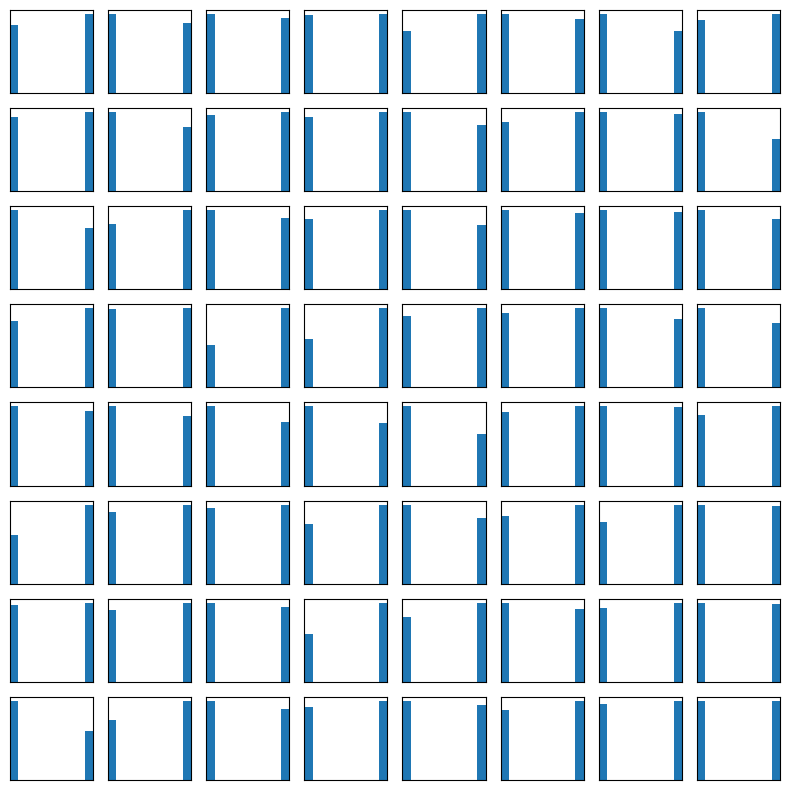

In [134]:
# See pixel distributions

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.hist(X_batch[i].cpu().view(-1)) 
    ax.set_xlim(0,1)
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
plt.show()

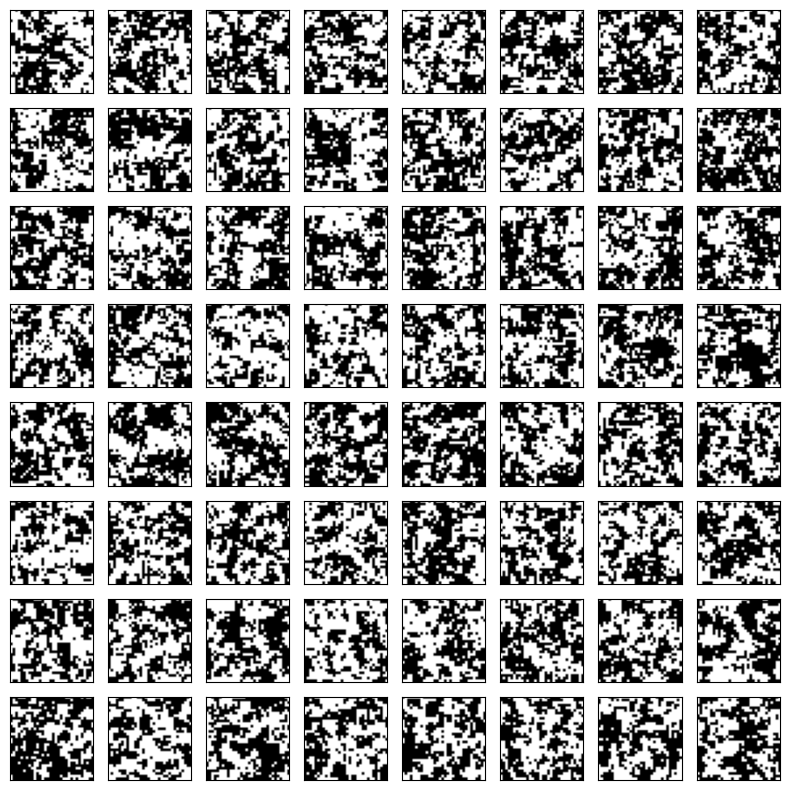

In [135]:
# See sample images

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8
    ax = fig.add_subplot(8, 8, i + 1)
    ax.imshow(X_batch[i].cpu().view(32, 32), cmap="gray")
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

## 1.5 Custom Dataset

Put a custum dataset inside data_dir and specify the file name. **Only supports numpy array files**.

Note that the code interprets data based on the first element of a data point that is 2-dimentional.

For example, if the dataset has 1000 data points and has shape (1000, 2, 500) with each data point containing 500 x values and 500 y values, respectively, only the x values will be considered and learned.

In [ ]:
# Split ratio between train_data and test_data
split = 0.8

file_name = os.path.join(data_dir, f"____.npy")  # Edit this line to load the desired dataset, e.g. f"Custum.npy"

dataset = np.load(file_name, allow_pickle=True)
dataset_tensor = torch.Tensor(dataset).float()
train_data, test_data = torch.split(dataset_tensor, int(len(dataset_tensor) * split))
print("Train shape: ", train_data.shape)
print("Test shape: ", test_data.shape)

train_loader = DataLoader(train_data, batch_size=64, shuffle=True, drop_last=True)
test_loader = DataLoader(test_data, batch_size=64, shuffle=True, drop_last=False)

# 2. Define RBM with binary units

In [176]:
class RBM_binary(nn.Module):
    """
    Restricted Boltzmann Machine with binary visible and hidden units.

    This class implements an RBM for learning binary data distributions using
    Contrastive Divergence (CD) or Persistent Contrastive Divergence (PCD).
    It supports both Gibbs sampling and Langevin dynamics for MCMC.

    Parameters: W, b, c

    update parameters for one batch
    calculate data visible energy and model visible energy
    difference between data and model visible energies
    one-step reconstruction mse
    """
    def __init__(self, n_visible, n_hidden, mf=False):
        super(RBM_binary, self).__init__()
        self.n_visible = n_visible  # nv
        self.n_hidden = n_hidden  # nh

        # Model parameters
        self.W = nn.Parameter(torch.randn(n_hidden, n_visible) * 0.01)  # (nh, nv)
        self.v_bias = nn.Parameter(torch.zeros(n_visible))  # (nv, )
        self.h_bias = nn.Parameter(torch.zeros(n_hidden))  # (nh, )

        # Persistent chain for PCD
        self.persistent_v = None
        self.mean_field = mf

    def alpha(self, v):
        """
        v^T W^T + c
        input_shape: [batch_size, nv]
        output shape: [batch_size, nh]
        """
        return F.linear(v, self.W, self.h_bias)

    def beta(self, h):
        """
        h^TW + b
        input_shape: [batch_size, nh]
        output shape: [batch_size, nv]
        """
        return F.linear(h, self.W.t(), self.v_bias)

    def bernoulli_sampling(self, p):
        """Sample from Bernoulli distribution with probability p."""
        return torch.bernoulli(p)

    def v_to_h(self, v):
        """
        Compute p(h|v) = sigmoid(Wv + c)
        and sample v -> h
        input_shape: [batch_size, nv]
        output shape: [batch_size, nh]
        """
        p_h = torch.sigmoid(self.alpha(v))
        return self.bernoulli_sampling(p_h)

    def h_to_v(self, h):
        """
        Compute p(v|h) = sigmoid(h^TW + b)
        and sample h -> v
        input_shape: [batch_size, nh]
        output shape: [batch_size, nv]
        """
        p_v = torch.sigmoid(self.beta(h))

        if not self.mean_field:  # binary v=0,1
            return self.bernoulli_sampling(p_v)
        return p_v  # mean-field 0<v<1

    def langevin_update(self, v, epsilon=0.1):
        """
        One Langevin step: v(t+1) = v(t) - epsilon^2/2 * dE/dv + epsilon*noise
        """
        v = v.view(-1, self.n_visible)  # [batch_size, nv]
       
        # if to use auto_diff
        # v = v.detach().clone().requires_grad_(True)
        # E = self.visible_energy(v).sum()
        # grad_v = torch.autograd.grad(E, v)[0]  # dE/dv

        # if to calculate gradient dE/dv manually
        grad_v = -self.v_bias.t() - torch.sigmoid(self.alpha(v)) @ self.W  # [batch_size, nv]
        
        # Gaussian noise
        noise = torch.randn_like(v)  # [batch_size, nv]

        # Langevin update
        v_new = v - (epsilon**2/2.) * grad_v + epsilon * noise

        # Absorbing (0,1)
        return v_new.clamp(0,1)  # torch.sigmoid(v_new).detach()
        
    def forward(self, v, mc='gibbs', k=1, epsilon=0.1):
        """
        Performs k-step Gibbs sampling v->h->v' or
        k-step Langevin dynamics sampling v->v'
        """
        v = v.view(-1, self.n_visible)  # [batch_size, nv]
      
        if mc == 'gibbs':
            with torch.no_grad():  # Gibbs does not need to do auto_diff
                for _ in range(k):
                    h = self.v_to_h(v)
                    v = self.h_to_v(h)
                    
        elif mc == 'langevin':  # Langevin MUST keep autograd to use it
            for _ in range(k):
                v = self.langevin_update(v, epsilon)
            # v = self.bernoulli_sampling(v.detach())
                    
        return v  # .detach()   

    def visible_energy(self, v):
        """Compute the visible energy E(v)."""
        vbias_term = v.mv(self.v_bias)  # b^T v: [batch_size, nv] x [nv, 1] = [batch_size, 1]
        wxv_c = self.alpha(v)  # Wv + c: [batch_size, nh]
        hidden_term = torch.sum(F.softplus(wxv_c), dim=1)  # [batch_size, 1]
        return -vbias_term - hidden_term

    def contrastive_divergence(self, v0, pcd=False, mc='gibbs', k=1, epsilon=0.1, lr=0.001):
        """
        Perform gradient descent for one batch
        with k-step Contrastive Divergence 
        """
        v_batch = v0.view(-1, self.n_visible)  # [batch_size, nv] 
        p_h_batch = torch.sigmoid(self.alpha(v_batch))  # [batch_size, nh]

        # Initialize persistent chain the first time
        if self.persistent_v is None:
            self.persistent_v = v_batch.detach().clone()

        # Data term
        self.W.grad = -torch.matmul(p_h_batch.t(), v_batch) / v_batch.size(0)  # [nh, nv]
        self.h_bias.grad = -torch.mean(p_h_batch, dim=0)  # [nh]
        self.v_bias.grad = -torch.mean(v_batch, dim=0)  # [nv]

        # Gibbs sampling
        if pcd:  # PCD
            self.persistent_v = self.persistent_v.detach().clone()  # [batch_size, nv]
            v_sample = self.forward(self.persistent_v, mc, k, epsilon)  # [batch_size, nv]
            self.persistent_v = v_sample.detach().clone()
        else:  # CD
            v_sample = self.forward(v_batch, mc, k, epsilon)  # [batch_size, nv]

        p_h_sample = torch.sigmoid(self.alpha(v_sample))  # [batch_size, nh]

        # Data term - model term
        self.W.grad -= -torch.matmul(p_h_sample.t(), v_sample) / v_batch.size(0)  # [nh, nv]
        self.h_bias.grad -= -torch.mean(p_h_sample, dim=0)  # [nh]
        self.v_bias.grad -= -torch.mean(v_sample, dim=0)  # [nv]

        # Update parameters manually by gradient descent
        for param in [self.W, self.v_bias, self.h_bias]:
            param.data -= lr * param.grad

        # Clamp values of weights
        # self.W.data.clamp_(-3, 5)
        
        E_data = torch.mean(self.visible_energy(v_batch))
        E_model = torch.mean(self.visible_energy(v_sample))       
        E_diff = E_model - E_data

        with torch.no_grad():
            # MSE Loss
            # loss = nn.MSELoss(reduction='mean') 
            # MSE = loss(v_sample, v_batch) 
            
            v_recon = self.forward(v_batch, mc='gibbs', k=1)
            MSE = torch.mean((v_recon - v_batch)**2)
    
            # Cross Entropy Loss
            h_prob = torch.sigmoid(self.alpha(v_batch))  # p(h | v_data)
            h_sample = torch.bernoulli(h_prob)  # sample h ~ p(h | v_data)
            v_prob = torch.sigmoid(self.beta(h_sample))  # p(v' | h)
            ce = nn.BCELoss()(v_prob, v_batch)
        
        return E_data, E_model, E_diff, MSE, ce

In [177]:
# Define RBM model

p = 28
n_visible = p*p  # 28x28 or 32x32
n_hidden = 512  # hidden units 512
mf = True  # mean-field v or not

cmap = 'gray' if mf else 'binary'

rbm = RBM_binary(n_visible, n_hidden, mf).to(device)

# 3. Define and run the training loops

In [178]:
def train(model, train_loader, pcd, mc, k, epsilon, lr, n_epochs):
    """
    Train the RBM model using Contrastive Divergence or Persistent Contrastive Divergence.

    Parameters:
    - model: RBM model instance
    - train_loader: DataLoader for training data
    - pcd: Boolean, True for PCD, False for CD
    - mc: MCMC method, 'gibbs' or 'langevin'
    - k: Number of MCMC steps
    - epsilon: Step size for Langevin dynamics
    - lr: Learning rate
    - n_epochs: Number of training epochs

    Returns:
    - history: Dictionary with training metrics
    """
    if pcd:
        print(f"Training with PCD and {k}-step {mc} updates")
    else:
        print(f"Training with CD and {k}-step {mc} updates")
    
    history = {"E_data": [], "E_model": [], "E_diff": [], "mse": [], "ce": []}

    for epoch in range(n_epochs):
        E_data_epoch, E_model_epoch, E_diff_epoch, mse_epoch, ce_epoch = 0., 0., 0., 0., 0.
        for _, batch_data in enumerate(train_loader):
            X_train = batch_data[0] if isinstance(batch_data, list) else batch_data
            X_train = X_train.to(device)
            E_data, E_model, E_diff, mse, ce = model.contrastive_divergence(X_train, pcd, mc, k, epsilon, lr)
            E_data_epoch += E_data.item()
            E_model_epoch += E_model.item()
            E_diff_epoch += E_diff.item()
            mse_epoch += mse.item()
            ce_epoch += ce.item()
        
        E_data_epoch /= len(train_loader)
        E_model_epoch /= len(train_loader)
        E_diff_epoch /= len(train_loader)
        mse_epoch /= len(train_loader)
        ce_epoch /= len(train_loader)
        
        history["E_data"].append(E_data_epoch)
        history["E_model"].append(E_model_epoch)

        history["E_diff"].append(E_diff_epoch)
        history["mse"].append(mse_epoch)
        history["ce"].append(ce_epoch)
            
        print(f"Epoch {epoch + 1}/{n_epochs}, E_data: {E_data_epoch:.4f}, E_model: {E_model_epoch:.4f}, E_diff: {E_diff_epoch:.4f}, mse: {mse_epoch:.4f}, ce: {ce_epoch:.4f}")

    return history

In [179]:
# Define training hyperparameters

n_epochs = 500
lr = 0.05
k = 10
pcd = True
mc = 'gibbs'  # gibbs or langevin
epsilon = 0.05  # langevin step size

cdtype = 'pcd' if pcd else 'cd'

In [180]:
# Run training. Replace train_loader with unlabeled_loader for STL10 if you want to train on unlabeled data.

history = train(rbm, train_loader, pcd, mc, k, epsilon, lr, n_epochs)

Training with PCD and 10-step gibbs updates
Epoch 1/500, E_data: -314.4781, E_model: -264.4305, E_diff: 50.0475, mse: 0.0451, ce: 0.1469
Epoch 2/500, E_data: -402.7436, E_model: -373.8883, E_diff: 28.8553, mse: 0.0255, ce: 0.0866
Epoch 3/500, E_data: -471.1691, E_model: -444.1780, E_diff: 26.9912, mse: 0.0212, ce: 0.0725
Epoch 4/500, E_data: -526.8146, E_model: -500.9411, E_diff: 25.8734, mse: 0.0188, ce: 0.0646
Epoch 5/500, E_data: -574.6034, E_model: -549.0459, E_diff: 25.5575, mse: 0.0173, ce: 0.0593
Epoch 6/500, E_data: -615.1467, E_model: -590.1214, E_diff: 25.0253, mse: 0.0161, ce: 0.0553
Epoch 7/500, E_data: -650.0147, E_model: -625.2688, E_diff: 24.7460, mse: 0.0152, ce: 0.0523
Epoch 8/500, E_data: -678.6924, E_model: -654.1009, E_diff: 24.5915, mse: 0.0145, ce: 0.0498
Epoch 9/500, E_data: -704.7908, E_model: -680.5468, E_diff: 24.2440, mse: 0.0139, ce: 0.0478
Epoch 10/500, E_data: -727.7632, E_model: -703.6383, E_diff: 24.1249, mse: 0.0134, ce: 0.0461
Epoch 11/500, E_data: -74

In [ ]:
# Resume Training
n_epochs = 1

history_temp = train(rbm, train_loader, pcd, mc, k, epsilon, lr, n_epochs)

for key in history:
    history[key].extend(history_temp[key])

n_epochs = len(history["E_data"])
print("Total epochs: ", n_epochs)

In [181]:
'''
Specfiy output directory and the directory name.
Resulting file structure will be:
├── out_dir
    ├── checkpoints
    |   └── dir_name
    ├── figures
    |   └── dir_name
    └── history
        └── dir_name
'''

out_dir = path.join("..", "outputs")
run_name = "Binary1"

checkpoints_dir = path.join(out_dir, "checkpoints", run_name)
figures_dir = path.join(out_dir, "figures", run_name)
history_dir = path.join(out_dir, "history", run_name)

os.makedirs(checkpoints_dir, exist_ok=True)
os.makedirs(figures_dir, exist_ok=True)
os.makedirs(history_dir, exist_ok=True)

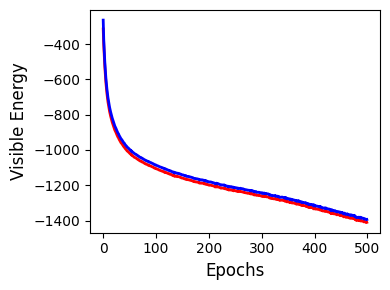

In [182]:
# Plot Visible Energies vs. Epochs and Save image

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4, 3))
axes.plot(history["E_data"],'r-', linewidth=2)
axes.plot(history["E_model"],'b-', linewidth=2)

axes.set_ylabel("Visible Energy", fontsize=12)
axes.set_xlabel("Epochs", fontsize=12)

plt.tight_layout()
plt.show()

fig.savefig(path.join(figures_dir, 'VEvsEpochs'), dpi = 600, bbox_inches='tight')

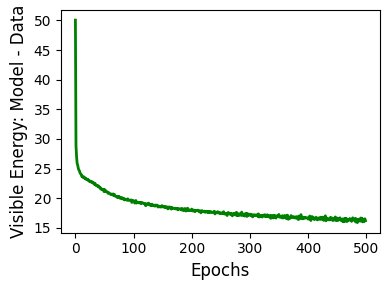

In [183]:
# Plot Visible Energy Difference vs. Epochs and Save image

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4, 3))
axes.plot(history["E_diff"],'g-', linewidth=2)

axes.set_ylabel("Visible Energy: Model - Data", fontsize=12)
axes.set_xlabel("Epochs", fontsize=12)

plt.tight_layout()
plt.show()

fig.savefig(path.join(figures_dir, 'VEdiffvsEpochs'), dpi = 600, bbox_inches='tight')

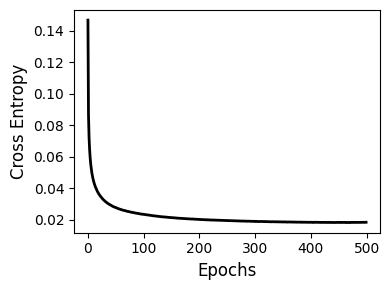

In [184]:
# Plot Cross Entropies vs. Epochs and Save image

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4, 3))
axes.plot(history["ce"],'k-', linewidth=2)

axes.set_ylabel("Cross Entropy", fontsize=12)
axes.set_xlabel("Epochs", fontsize=12)

plt.tight_layout()
plt.show()

fig.savefig(path.join(figures_dir, 'CEvsEpochs'), dpi = 600, bbox_inches='tight')

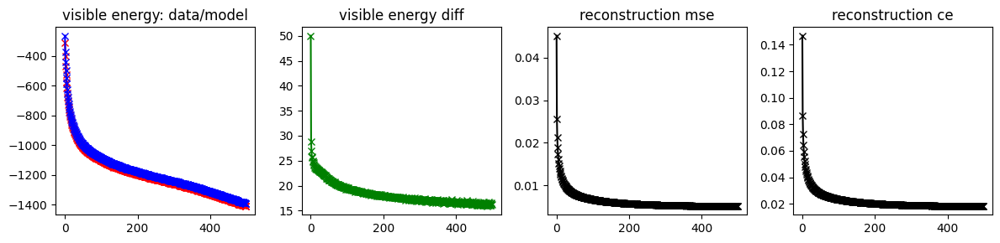

In [185]:
# Plot history

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(12, 3))

axes[0].plot(history["E_data"],'rx-')
axes[0].plot(history["E_model"],'bx-')

axes[1].plot(history["E_diff"],'gx-')
axes[2].plot(history["mse"],'kx-')
axes[3].plot(history["ce"],'kx-')


axes[0].set_title('visible energy: data/model')
axes[1].set_title('visible energy diff')
axes[2].set_title('reconstruction mse')
axes[3].set_title('reconstruction ce')

plt.tight_layout()
plt.show()

fig.savefig(path.join(figures_dir, 'training_history.png'), dpi=600, bbox_inches='tight')

# 4. Optional saving and reloading steps

## (4.1) Save model parameters and training results

In [186]:
# Save parameters as numpy array files

for name, param in rbm.state_dict().items():
    print(f'parameter: {name}, size: {param.size()}')
    np.save(os.path.join(checkpoints_dir, f"{name}.npy"), param.cpu().numpy())

np.save(os.path.join(history_dir, f"training_nh{n_hidden}{cdtype}-{k}{mc}_lr{lr}.npy"), history, allow_pickle=True)  # save a list of dictionary

parameter: W, size: torch.Size([512, 784])
parameter: v_bias, size: torch.Size([784])
parameter: h_bias, size: torch.Size([512])


## (4.2) Reload parameters or training results

In [187]:
################################################
# To load parameters from npy file
################################################

state_dict = rbm.state_dict()  # get a copy of current state dict
for name in state_dict.keys():
    param = np.load(os.path.join(checkpoints_dir, f"{name}.npy"))
    state_dict[name] = torch.tensor(param)

rbm.load_state_dict(state_dict)  # this actually loads the parameters

training_history = np.load(os.path.join(history_dir, f"training_nh{n_hidden}{cdtype}-{k}{mc}_lr{lr}.npy"), allow_pickle=True).tolist()  # a list of dictionary

# 5. Reconstruction test

In [188]:
# Reconstruction using a small batch

# Get batch
test_batch = next(iter(test_loader))
X_test = test_batch[0] if isinstance(test_batch, list) else test_batch


# Reconstruction from first 10 in batch
X_test = X_test[:10].to(device)
X_test.shape

torch.Size([10, 784])

In [189]:
# Reconstruction Using the entire test dataset

X_test = test_loader.dataset.data
X_test = X_test.to(device).float().view(-1, n_visible)
X_test.shape

torch.Size([10000, 784])

In [ ]:
# Use Gibbs sampling for reconstruction

with torch.no_grad():  # no graph, avoid GPU memory growth
    X_recon = rbm.forward(X_test, mc='gibbs', k=1).detach() 
# X_recon = X_recon.clamp(0,1)

In [ ]:
# Use Langevin dynamics for reconstruction

X_gen = rbm.forward(X_test, mc='langevin', k=1, epsilon=epsilon).detach()  # langevin autodiff must use graph, GPU memory cautious
# X_gen = X_gen.clamp(0,1) 

In [193]:
# See test and reconstructed shapes

print(X_test.shape)
print(X_recon.shape)

torch.Size([10000, 784])
torch.Size([10000, 784])


## 5.1 Reconstruction: Ising Model

Contains code that only works for ising datasets.

In [153]:
import math

def ising_energy(tensor, dimension = None, J = 1.0):
    '''
    Given a batch of configurations, compute the Ising energy for each configuration.

    Parameters:
    - tensor: A batch of configurations, shape [batch_size, p * p] or
    [p * p] for a single configuration. In -1, +1 format NOT BINARY.
    - dimension: The dimensions of the grid. If None, it will be inferred from the tensor's second dimension assuming a square grid.
    - J: The coupling constant.

    Returns:
    - E: A tensor of energies for each configuration, shape [batch_size, ]

    Input size: [batch_size, p * p]
    Output size: [batch_size, ]
    '''
    if tensor.dim() == 2:
        batch_size = tensor.shape[0]
        size = tensor.shape[1]
        
    elif tensor.dim() == 1:
        tensor = tensor.unsqueeze(0)
        batch_size = 1
        size = tensor.shape[0]
    else:
        raise ValueError("Tensor must be 1D or 2D. \n", f"Usage: ising_energy(Tensor[batch_size, p * p], dimension=[p, p], J = 1.0).")
        
    # If dimension is not provided, assume it's a square grid and infer dimensions from size
    if dimension == None:
        if not math.isqrt(size):
            raise ValueError(f"Tensor's 2nd dimension needs to be a perfect square if dimension is set to None. Tensor shape is: {tensor.shape}. Suggestion: set dimension=[p, p] where p is the grid size.")
        sqrt = np.sqrt(size)
        dimension = [int(sqrt), int(sqrt)]

    dim1, dim2 = dimension
    grid = tensor.view(batch_size, dim1, dim2)
    right = grid.roll(shifts=-1, dims=2) # Horizontal Neighbors
    down = grid.roll(shifts=-1, dims=1) # Vertical Neighbors

    E_h = (grid * right)  # Horizontal energy
    E_v = (grid * down)   # Vertical energy

    sums = E_h.sum(dim=(1,2)) + E_v.sum(dim=(1,2))
    E = -J * sums

    return E

def ising_capacity(energies, T, k_B = 1.0):
    '''
    Given a batch of energies given by the previous function, 
    compute the heat capacity.

    Parameters:
    - energies: A batch of energies, shape [batch_size, ]
    - T: The temperature.
    - k_B: The Boltzmann constant.

    Returns:
    - C: The heat capacity, shape [1, ]

    Input size: [batch_size, ] of Energies
    Output size: [1, ]
    '''

    E_mean = energies.mean()
    E2_mean = (energies**2).mean()

    C = (E2_mean - E_mean**2) / (k_B * T**2)
    
    return C

def ising_magnetization_chi(tensor, T, k_B = 1.0):
    '''
    Given a batch of configurations, compute the 
    magnetization and susceptibility.

    Parameters:
    - tensor: A batch of configurations, shape [batch_size, p * p] or
    [p * p] for a single configuration. In -1, +1 format NOT BINARY.
    - T: The temperature.
    - k_B: The Boltzmann constant.

    Returns:
    - m_mean: The mean magnetization, shape [1, ]
    - chi: The susceptibility, shape [1, ]
    - m_abs: Absolute values of the calculated raw magnetizations for each configuration, shape [batch_size, ]
    as a m_mean, chi tuple

    Input size: [batch_size, p * p]
    Output size: [2, ]
    '''
    if tensor.dim() == 1:
        tensor = tensor.unsqueeze(0)  # Add batch dimension if input is a single configuration

    m = tensor.sum(dim=1)  # magnetization
    m_abs = m.abs()
    m_mean_abs = m_abs.mean()

    m_mean = m.mean()
    m2_mean = (m**2).mean()

    chi = (m2_mean - m_mean**2) / (k_B * T)

    return m_mean_abs, chi, m_abs

In [154]:
# Test ising energy function with a simple example

example_config = torch.ones(1, 4)

E = ising_energy(example_config, [2, 2])
C = ising_capacity(E, float(T))
m, chi, m_per = ising_magnetization_chi(example_config, float(T))

N = example_config.shape[1]

print("Total Energy (E): ", E)
print("Energy per site (E/N): ", E / N)
print("Total Heat Capacity (C): ", C)
print("Heat Capacity per site (C/N): ", C / N)
print("Total Magnetization (m): ", m)
print("Magnetization per site (m/N): ", m / N)
print("Total Susceptibility (chi): ", chi)
print("Susceptibility per site (chi/N): ", chi / N)

Total Energy (E):  tensor([-8.])
Energy per site (E/N):  tensor([-2.])
Total Heat Capacity (C):  tensor(0.)
Heat Capacity per site (C/N):  tensor(0.)
Total Magnetization (m):  tensor(4.)
Magnetization per site (m/N):  tensor(1.)
Total Susceptibility (chi):  tensor(0.)
Susceptibility per site (chi/N):  tensor(0.)


In [155]:
# Compute Energies. Make sure to change binary to -1, +1 before putting in ising energy.

X_test_energy = ising_energy(2 * X_test.cpu() - 1)
X_recon_energy = ising_energy(2* X_recon.cpu() - 1)

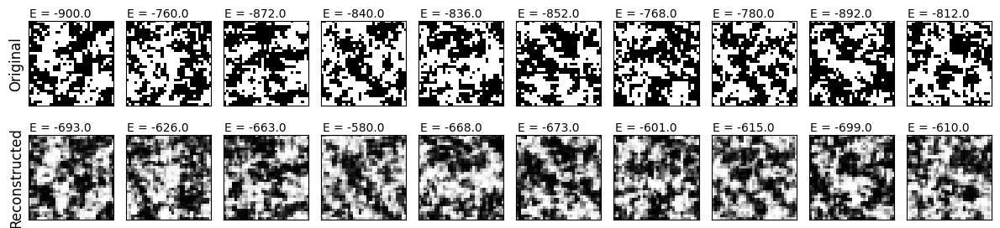

In [156]:
# See First 10 Reconstructed vs Original images along with their computed energies

fig, axes = plt.subplots(2, 10, figsize=(12, 3))
for i in range(10):
    axes[0, i].imshow(X_test[i].cpu().view(p, p), cmap=cmap) # use "binary" for v=0,1 "gray" for 0<v<1
    # axes[0, i].axis("off")
    axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])
    axes[0, i].text(0, -2, f"E = {X_test_energy[i].round()}")
    axes[1, i].imshow(X_recon[i].cpu().view(p, p), cmap=cmap)
    # axes[1, i].axis("off")
    axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])
    axes[1, i].text(0, -2, f"E = {X_recon_energy[i].round()}")
    
axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Reconstructed", fontsize=12)

plt.tight_layout()
plt.show()

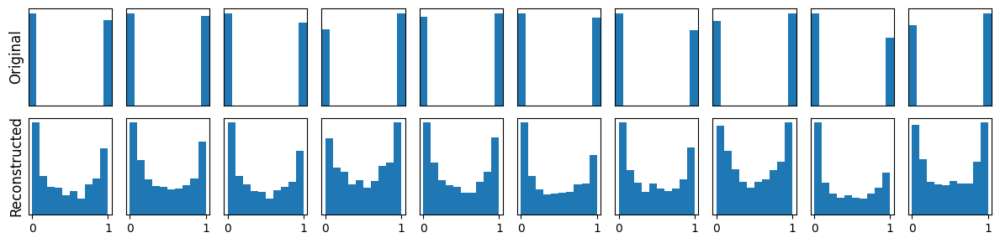

In [157]:
# Check histogram distribution for the first 10 images

fig, axes = plt.subplots(2, 10, figsize=(12, 3))
for i in range(10):
    axes[0, i].hist(X_test[i].cpu().view(-1)) 
    axes[0, i].set_xlim(0,1)
    # axes[0, i].axis("off")
    axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])
    
    axes[1, i].hist(X_recon[i].cpu().view(-1)) 
    # axes[1, i].set_xlim(0,1)
    # axes[1, i].axis("off")
    # axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])

axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Reconstructed", fontsize=12)

plt.tight_layout()
plt.show()

In [158]:
# Compare physical properties of test and reconstructed ising models.
# Make sure to change binary to -1, +1 before putting in ising energy.

X_test_energy = ising_energy(2 * X_test.cpu() - 1)
X_recon_energy = ising_energy(2 * X_recon.cpu() - 1)
X_test_capacity = ising_capacity(X_test_energy, float(T))
X_recon_capacity = ising_capacity(X_recon_energy, float(T))

X_test_magnetization, X_test_chi, X_test_m_per = ising_magnetization_chi(2 * X_test.cpu() - 1, float(T))
X_recon_magnetization, X_recon_chi, X_recon_m_per = ising_magnetization_chi(2 * X_recon.cpu() - 1, float(T))

N = X_test.shape[1]

# Per-config energy and magnetization arrays, normalized by N
e_test  = X_test_energy / N  # shape [batch_size,]
e_recon = X_recon_energy / N
m_test  = X_test_m_per / N  # shape [batch_size,]
m_recon = X_recon_m_per / N

print("Test E/N",e_test.mean())
print("Recon E/N", e_recon.mean())
print("Test C/N", X_test_capacity  / N)
print("Recon C/N", X_recon_capacity / N)
print("Test M/N", m_test.mean())
print("Recon M/N", m_recon.mean())
print("Test Chi/N", X_test_chi  / N)
print("Recon Chi/N", X_recon_chi / N)

Test E/N tensor(-0.8172)
Recon E/N tensor(-0.6149)
Test C/N tensor(0.3900)
Recon C/N tensor(0.3189)
Test M/N tensor(0.0820)
Recon M/N tensor(0.0792)
Test Chi/N tensor(3.6176)
Recon Chi/N tensor(2.5828)


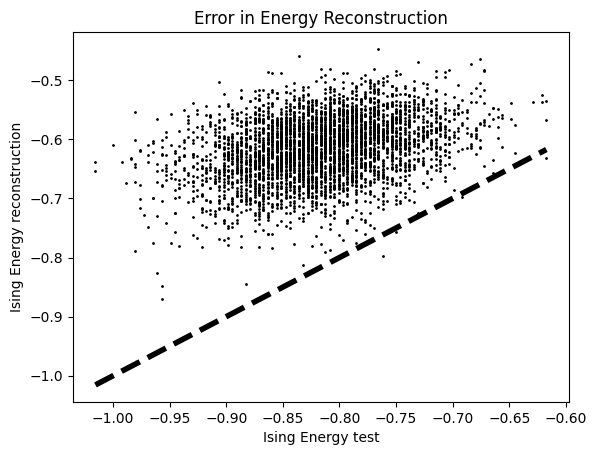

In [159]:
# Compare test and recon energies with a scatter plot.
# Ideally, they should lie on the y=x line if reconstruction is perfect.

plt.scatter(e_test, e_recon,color='k',s=1)
XE_min = e_test.min()
XE_max = e_test.max()

plt.plot([XE_min,XE_max],[XE_min,XE_max],'k--', linewidth=4)
plt.title('Error in Energy Reconstruction')
plt.xlabel('Ising Energy test')
plt.ylabel('Ising Energy reconstruction')
plt.show()

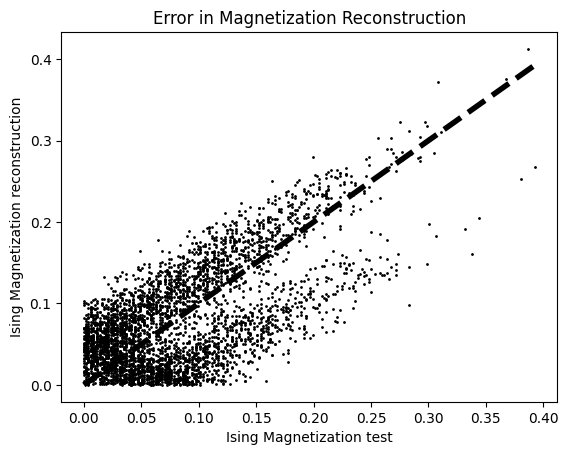

In [160]:
# Compare test and recon magnetization with a scatter plot.
# Ideally, they should lie on the y=x line if reconstruction is perfect.

plt.scatter(m_test, m_recon,color='k',s=1)
XM_min = m_test.min()
XM_max = m_test.max()

plt.plot([XM_min,XM_max],[XM_min,XM_max],'k--', linewidth=4)
plt.title('Error in Magnetization Reconstruction')
plt.xlabel('Ising Magnetization test')
plt.ylabel('Ising Magnetization reconstruction')
plt.show()

## 5.2 Reconstruction: Other datasets

Works for general datasets.

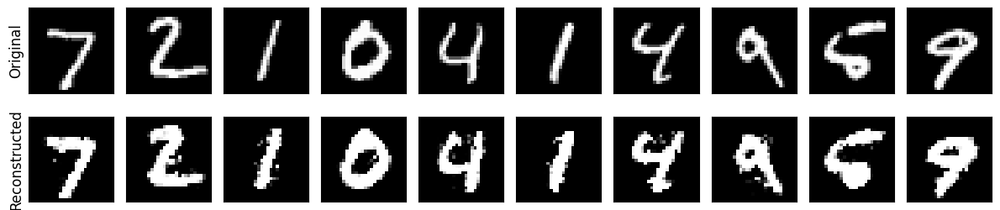

In [194]:
# See Reconstructed vs Original images

fig, axes = plt.subplots(2, 10, figsize=(12, 3))
for i in range(10):
    axes[0, i].imshow(X_test[i].cpu().view(p, p), cmap=cmap) # use "binary" for v=0,1 "gray" for 0<v<1
    # axes[0, i].axis("off")
    axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])
    axes[1, i].imshow(X_recon[i].cpu().view(p, p), cmap=cmap)
    # axes[1, i].axis("off")
    axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])
    
axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Reconstructed", fontsize=12)

plt.tight_layout()
plt.show()

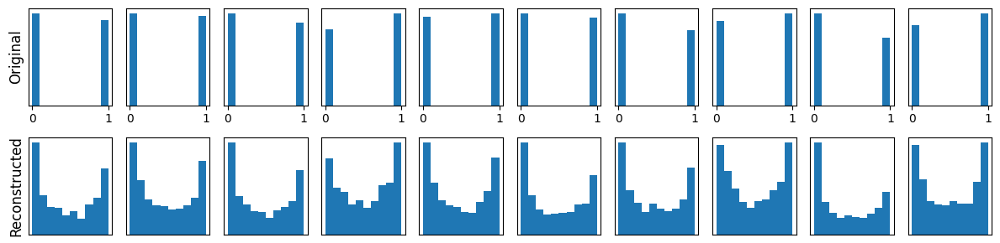

In [163]:
# Check histogram distribution

fig, axes = plt.subplots(2, 10, figsize=(12, 3))
for i in range(10):
    axes[0, i].hist(X_test[i].cpu().view(-1)) 
    # axes[0, i].set_xlim(0,1)
    # axes[0, i].axis("off")
    axes[0, i].set_yticks([])
    
    axes[1, i].hist(X_recon[i].cpu().view(-1)) 
    # axes[1, i].set_xlim(0,1)
    # axes[1, i].axis("off")
    axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])

axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Reconstructed", fontsize=12)

plt.tight_layout()
plt.show()

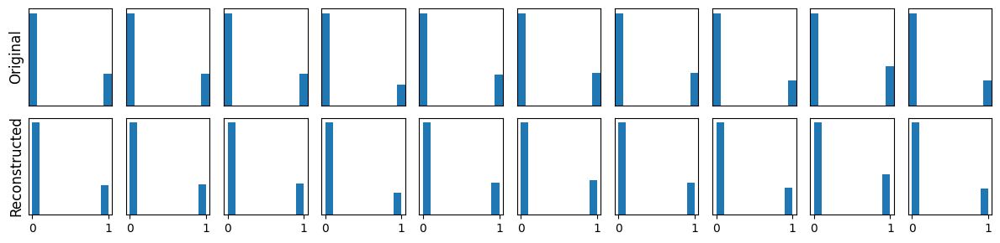

In [ ]:
# Check hidden units histogram

h_test = rbm.v_to_h(X_test.to(device)).detach() 
h_recon = rbm.v_to_h(X_recon.to(device)).detach()

fig, axes = plt.subplots(2, 10, figsize=(12, 3))
for i in range(10):
    axes[0, i].hist(h_test[i].cpu().view(-1)) 
    axes[0, i].set_xlim(0,1)
    # axes[0, i].axis("off")
    axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])
    
    axes[1, i].hist(h_recon[i].cpu().view(-1))
    # axes[1, i].set_xlim(0,1)
    # axes[1, i].axis("off")
    # axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])

axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Reconstructed", fontsize=12)

plt.tight_layout()
plt.show()

# 6. Generation from random start

In [ ]:
# Generate starting from a random pixel distribution or a random hidden unit distribution.
# Commented out lines are for different initializations.

n_sample = 256

ph = 0.3  # Bernoulli probability
h0 = torch.bernoulli(torch.ones(n_sample, n_hidden)*ph).float().to(device)  # bernoulli 0,1 with probability ph
X0 = rbm.h_to_v(h0)

# X0 = torch.randint(1, (n_sample, n_visible),requires_grad=False).float().to(device)  # binary 0,1
# X0 = torch.rand((n_sample, n_visible),requires_grad=False).float().to(device)  # uniform [0,1]

In [ ]:
# Use Gibbs sampling for generation

with torch.no_grad():  # no graph, avoid GPU memory growth
    X_gen = rbm.forward(X0, mc='gibbs', k=1000).detach()  # gibbs or manual diff langevin does not need graph
# X_gen = X_gen.clamp(0,1) 

In [ ]:
# Use Langevin dynamics for generation

X_gen = rbm.forward(X0, mc='langevin', k=1000, epsilon=epsilon).detach()  # langevin autodiff must use graph, GPU memory cautious
# X_gen = X_gen.clamp(0,1) 

## 6.1 Generation: Ising Dataset

Contains code that only works for ising datasets.

In [167]:
# Compare physical properties of test and generated ising models.
# Make sure to change binary to -1, +1 before putting in ising energy.

X_test_energy = ising_energy(2 * X_test.cpu() - 1)
X_gen_energy = ising_energy(2 * X_gen.cpu() - 1)
X_test_capacity = ising_capacity(X_test_energy, float(T))
X_gen_capacity = ising_capacity(X_gen_energy, float(T))

X_test_magnetization, X_test_chi, X_test_m_per = ising_magnetization_chi(2 * X_test.cpu() - 1, float(T))
X_gen_magnetization, X_gen_chi, X_gen_m_per = ising_magnetization_chi(2 * X_gen.cpu() - 1, float(T))

N = X_test.shape[1]

# Per-config energy and magnetization arrays, normalized by N
e_test  = X_test_energy / N  # shape [batch_size,]
e_gen = X_gen_energy / N
m_test  = X_test_m_per / N  # shape [batch_size,]
m_gen = X_gen_m_per  / N

print("Test E/N", e_test.mean())
print("Gen E/N", e_gen.mean())
print("Test C/N", X_test_capacity  / N)
print("Gen C/N", X_gen_capacity / N)
print("Test M/N", m_test.mean())
print("Gen M/N", m_gen.mean())
print("Test Chi/N", X_test_chi  / N)
print("Gen Chi/N", X_gen_chi / N)

Test E/N tensor(-0.8172)
Gen E/N tensor(-0.9262)
Test C/N tensor(0.3900)
Gen C/N tensor(0.2467)
Test M/N tensor(0.0820)
Gen M/N tensor(0.2058)
Test Chi/N tensor(3.6176)
Gen Chi/N tensor(0.7730)


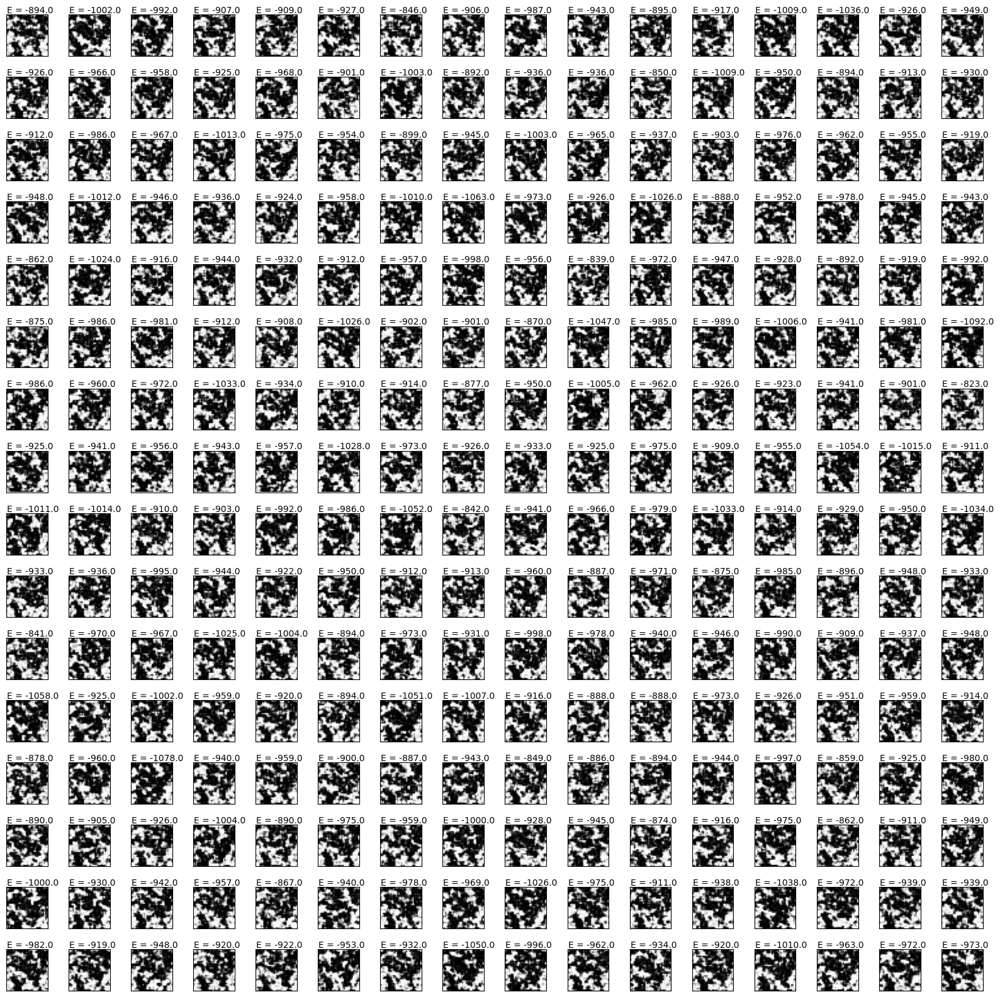

In [168]:
# See generated images along with their computed energies

fig = plt.figure(figsize=(16, 16)) 
for i in range(256):  # 16 × 16 grid
    ax = fig.add_subplot(16, 16, i + 1)
    ax.imshow(X_gen[i].cpu().view(p, p), cmap=cmap)
    ax.text(0, -2, f"E = {X_gen_energy[i].round()}")
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
plt.show()

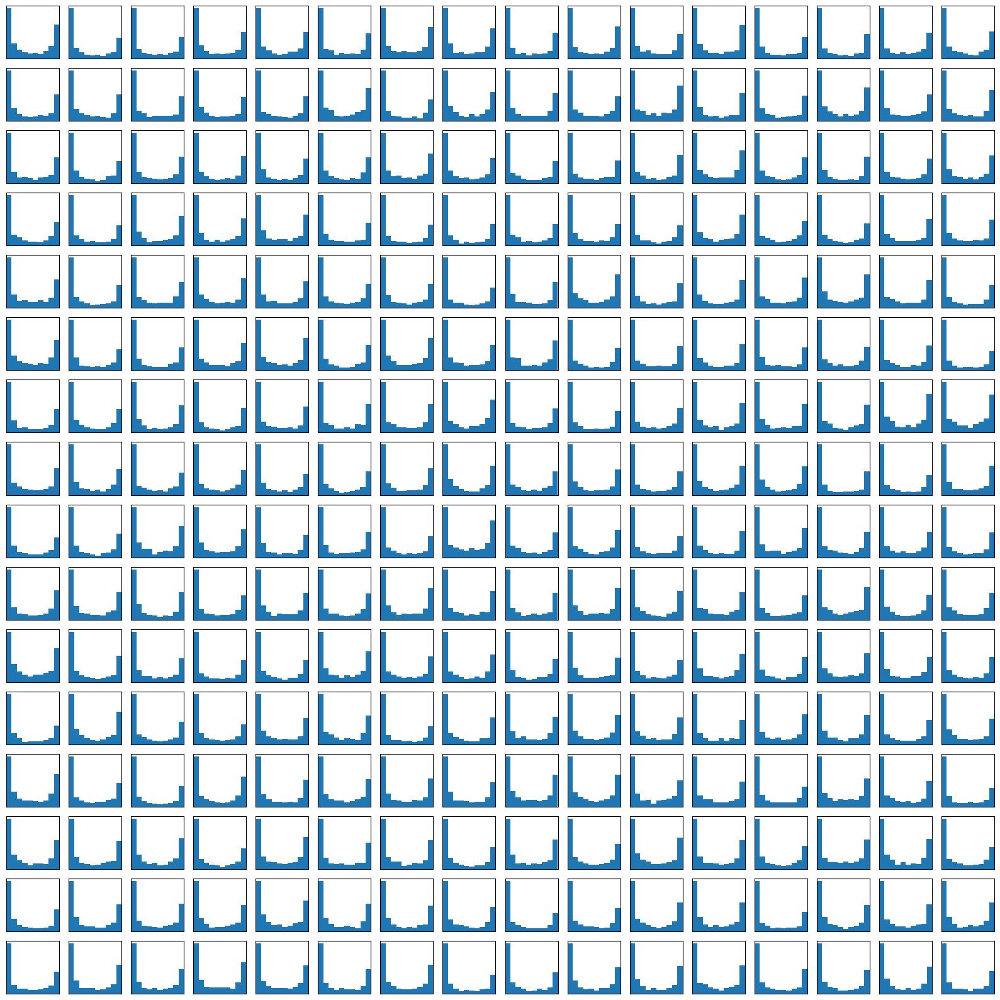

In [169]:
# Check histogram distribution

fig = plt.figure(figsize=(16, 16)) 
for i in range(256):  # 16 × 16 grid
    ax = fig.add_subplot(16, 16, i + 1)
    ax.hist(X_gen[i].cpu().view(-1)) 
    # ax.axis('off')
    ax.set_xlim(0,1)
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

torch.Size([256])
torch.Size([4000])


(array([[  0.,   0.,   2.,   1.,  10.,  22.,  48.,  51., 120., 177., 321.,
         430., 373., 509., 425., 483., 386., 225., 188., 101.,  65.,  39.,
          14.,   4.,   6.],
        [  2.,   2.,   6.,  10.,  19.,  18.,  33.,  38.,  39.,  43.,  23.,
          11.,   5.,   6.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   0.,   0.]]),
 array([-1.06654215, -1.04856801, -1.03059375, -1.01261961, -0.99464542,
        -0.97667122, -0.95869702, -0.94072282, -0.92274868, -0.90477449,
        -0.88680029, -0.86882609, -0.85085189, -0.83287776, -0.8149035 ,
        -0.79692936, -0.77895516, -0.76098096, -0.74300683, -0.72503257,
        -0.70705843, -0.68908423, -0.67111003, -0.6531359 , -0.63516164,
        -0.6171875 ]),
 <a list of 2 BarContainer objects>)

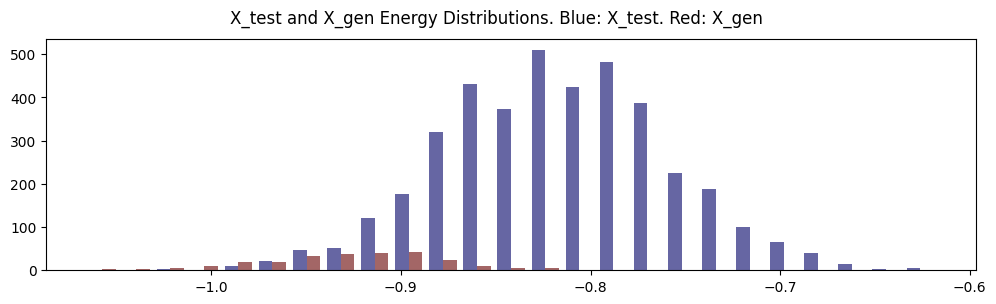

In [170]:
# Compare test and gen energies with a histogram distribution.

print(e_gen.shape)
print(e_test.shape)

fig, axes = plt.subplots(1, 1, figsize=(12, 3))

fig.suptitle("X_test and X_gen Energy Distributions. Blue: X_test. Red: X_gen")

axes.hist((e_test.cpu(), e_gen.cpu()), bins=25, color=((0, 0, 0.4, 0.6), (0.4, 0, 0, 0.6)))

# fig.savefig(os.path.join(figures_dir, "X_test, X_gen Energies.png"))

torch.Size([256])
torch.Size([4000])


(array([[504., 503., 460., 388., 380., 323., 298., 261., 206., 171., 133.,
          98.,  79.,  61.,  51.,  30.,  16.,  14.,   9.,   7.,   0.,   3.,
           0.,   2.,   3.],
        [  0.,   0.,   0.,   0.,   2.,   2.,   1.,   1.,  15.,  16.,  27.,
          31.,  32.,  27.,  36.,  20.,  18.,  11.,  10.,   2.,   5.,   0.,
           0.,   0.,   0.]]),
 array([0.        , 0.01570312, 0.03140625, 0.04710937, 0.0628125 ,
        0.07851563, 0.09421875, 0.10992187, 0.125625  , 0.14132813,
        0.15703125, 0.17273438, 0.18843749, 0.20414062, 0.21984375,
        0.23554687, 0.25125   , 0.26695311, 0.28265625, 0.29835936,
        0.31406251, 0.32976562, 0.34546876, 0.36117187, 0.37687498,
        0.39257812]),
 <a list of 2 BarContainer objects>)

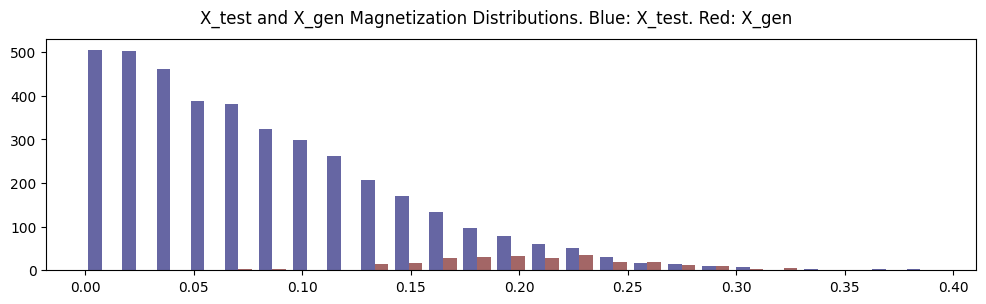

In [171]:
# Compare test and gen magnetization with a histogram distribution.

print(m_gen.shape)
print(m_test.shape)

fig, axes = plt.subplots(1, 1, figsize=(12, 3))

fig.suptitle("X_test and X_gen Magnetization Distributions. Blue: X_test. Red: X_gen")

axes.hist((m_test.cpu(), m_gen.cpu()), bins=25, color=((0, 0, 0.4, 0.6), (0.4, 0, 0, 0.6)))

# fig.savefig(os.path.join(figures_dir, "X_test, X_gen Magnetizations.png"))

## 6.1 Generation: Other Datasets

Works for general datsets.

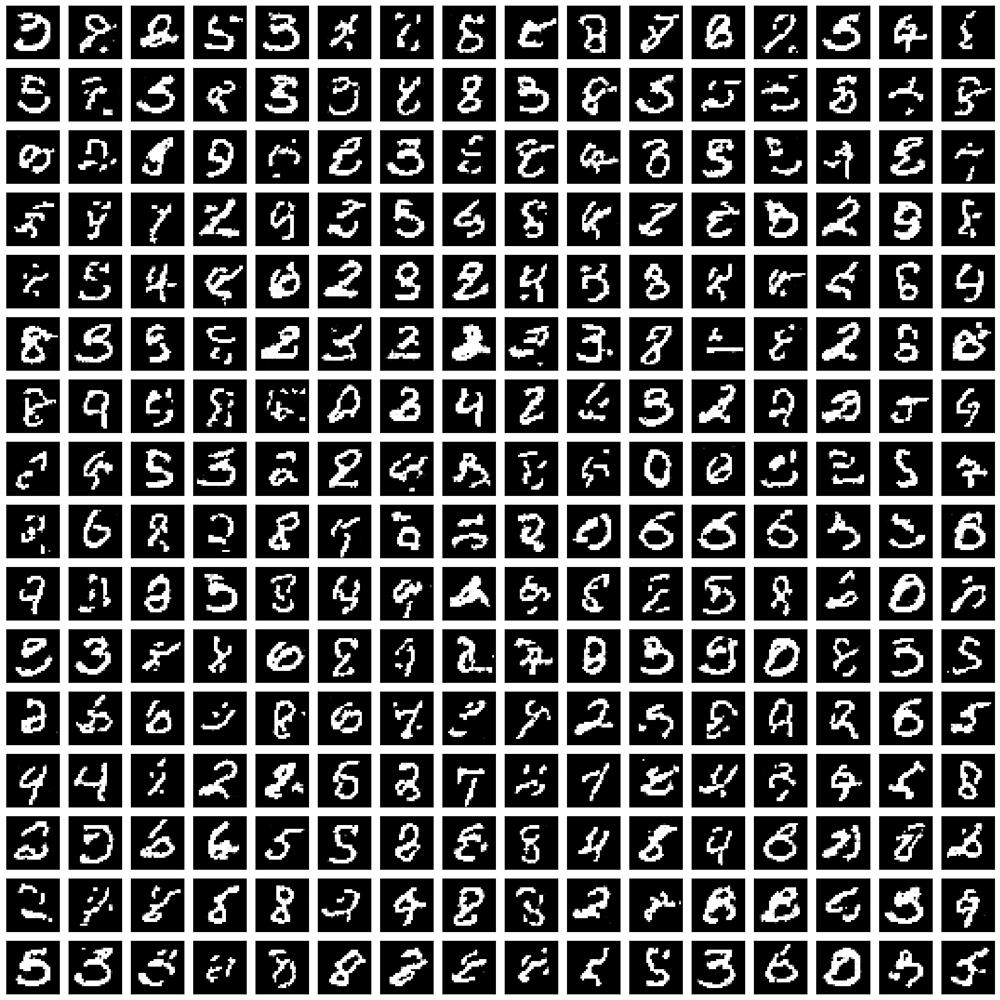

In [197]:
# See generated images

fig = plt.figure(figsize=(16, 16)) 
for i in range(256):  # 16 × 16 grid
    ax = fig.add_subplot(16, 16, i + 1)
    ax.imshow(X_gen[i].cpu().view(p, p), cmap=cmap)
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
plt.show()

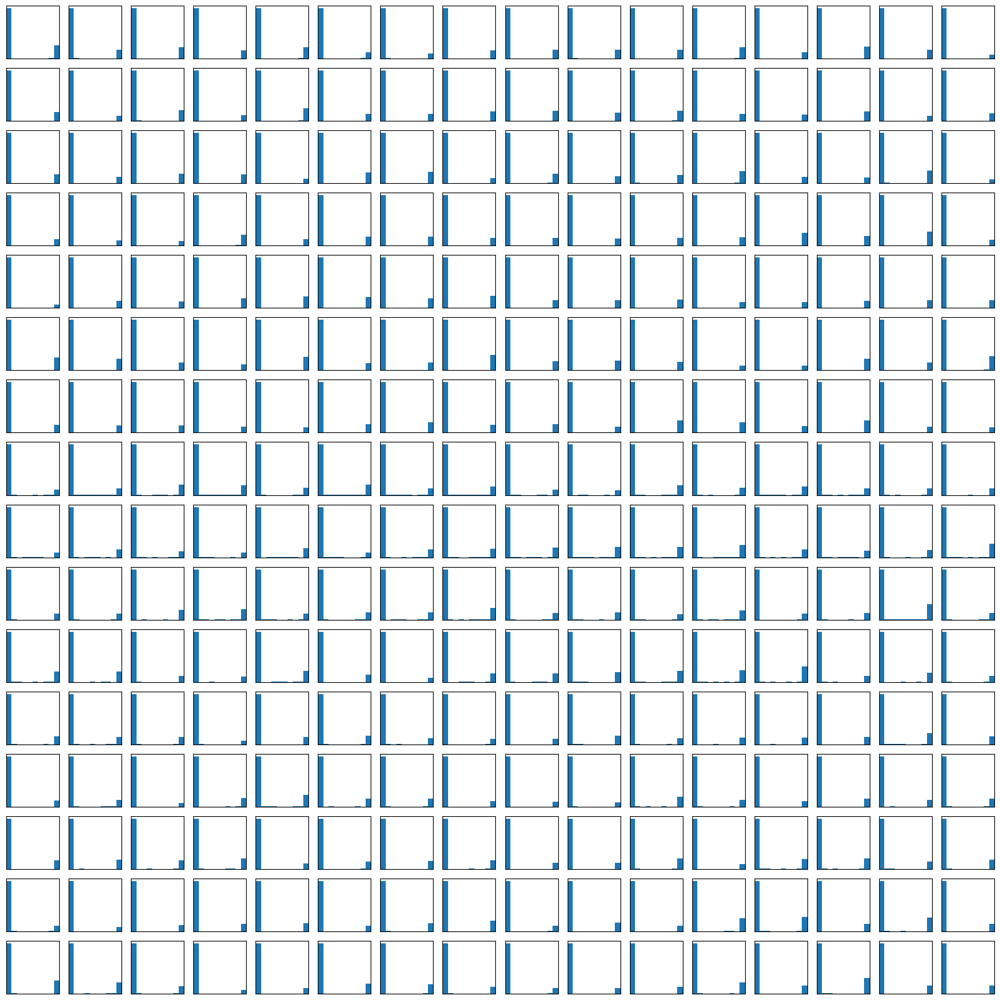

In [198]:
# Check histogram distribution

fig = plt.figure(figsize=(16, 16)) 
for i in range(256):  # 16 × 16 grid
    ax = fig.add_subplot(16, 16, i + 1)
    ax.hist(X_gen[i].cpu().view(-1)) 
    # ax.axis('off')
    ax.set_xlim(0,1)
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

## Check hidden units histogram


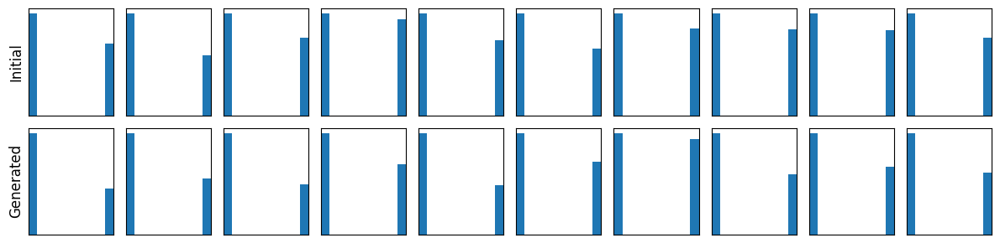

In [199]:
# Get hidden units
with torch.no_grad():
    h0 = rbm.v_to_h(X0.to(device)).detach() 
    h_gen = rbm.v_to_h(X_gen.to(device)).detach() 

# Plot
fig, axes = plt.subplots(2, 10, figsize=(12, 3))
for i in range(10):
    axes[0, i].hist(h0[i].cpu().view(-1)) 
    axes[0, i].set_xlim(0,1)
    # axes[0, i].axis("off")
    axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])
    
    axes[1, i].hist(h_gen[i].cpu().view(-1))
    axes[1, i].set_xlim(0,1)
    # axes[1, i].axis("off")
    axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])
    
axes[0, 0].set_ylabel("Initial", fontsize=12)
axes[1, 0].set_ylabel("Generated", fontsize=12)

plt.tight_layout()
plt.show()

## (Optional) Check PCD persistent v batch

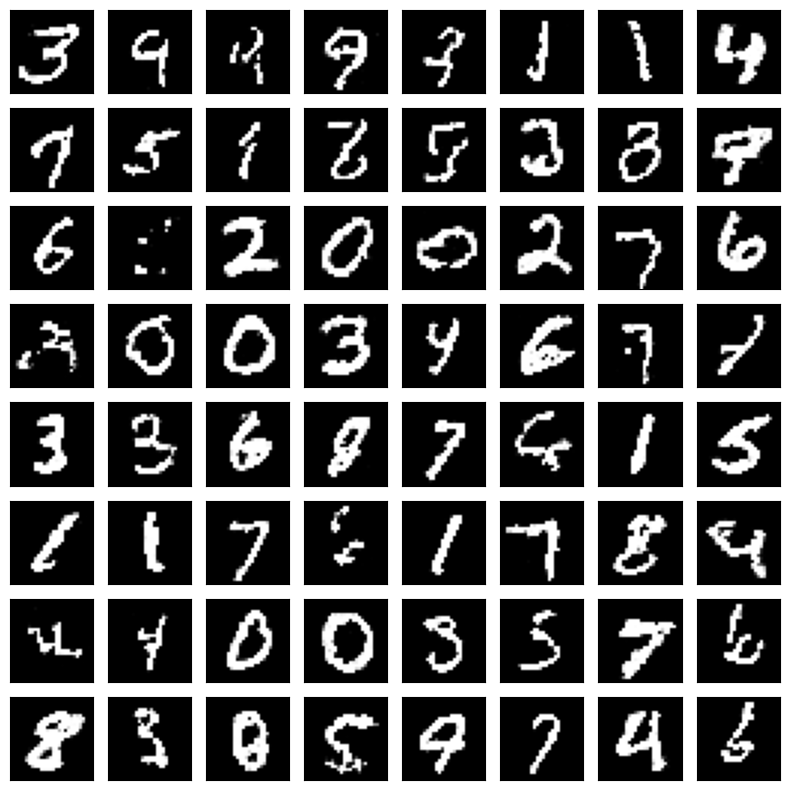

In [200]:
# See images of the persistent batch

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.imshow(rbm.persistent_v[i].cpu().view(p, p), cmap=cmap)
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
plt.show()

# 7. Plot weight matrix W as filters (row vectors folded)

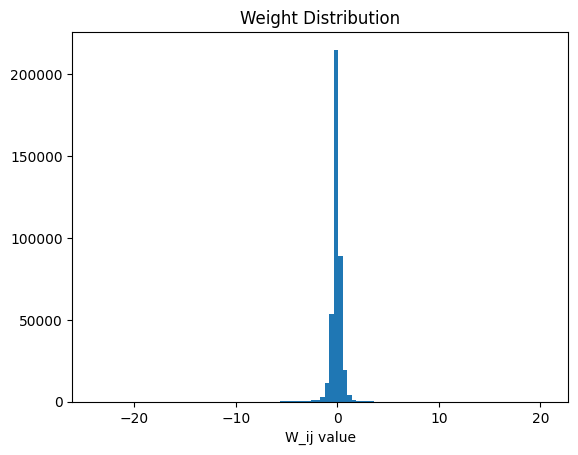

In [201]:
# Check weight distribution

plt.hist(rbm.W.detach().cpu().flatten(), bins=100)
plt.xlabel("W_ij value")
plt.title("Weight Distribution")
plt.show()

In [202]:
# Get weight matrix

Weight = rbm.W.detach().cpu()

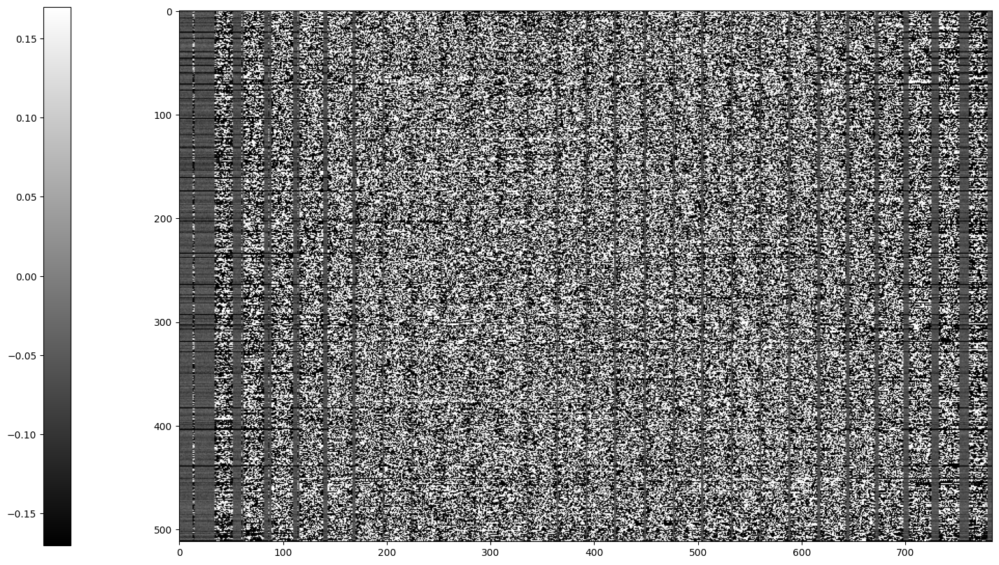

In [203]:
# Plot the full weight matrix

fig, axes = plt.subplots(1, 1, figsize=(20, 10))
img = axes.imshow(Weight, cmap="gray", vmin=-0.17, vmax=0.17)
plt.colorbar(img, location='left')
plt.show()

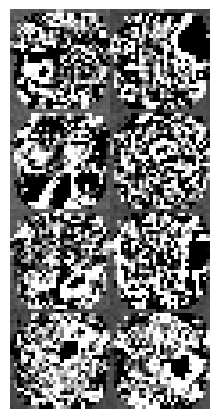

In [204]:
# Visualize random weight filters (rows of W reshaped to images)

import random

rows = 4
cols = 2

indices = random.sample(range(len(Weight)), rows*cols)
indices = np.array(indices).reshape(rows, cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols, rows),
                        gridspec_kw={'wspace': 0, 'hspace': 0})

for r in range(rows):
    for c in range(cols):
        axes[r][c].imshow(Weight[indices[r][c]].view(p, p), cmap="gray", vmin=-0.17, vmax=0.17, aspect='auto')
        axes[r][c].set_axis_off()
        axes[r][c].margins(x=0, y=0)

fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.show()

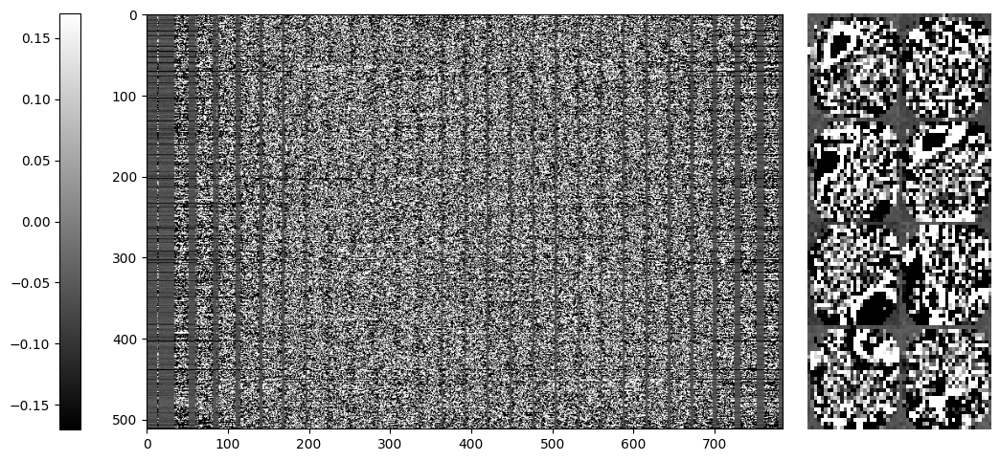

In [205]:
# Combine weight matrix and receptive fields into one figure

fig = plt.figure(figsize=(12, 5))

# define a 1x2 outer grid - left for weight matrix, right for receptive fields
from matplotlib.gridspec import GridSpec
gs = GridSpec(1, 2, figure=fig, wspace=0.05, width_ratios=[4.5, 1])

# Left: full weight matrix
ax_left = fig.add_subplot(gs[0])
img = ax_left.imshow(Weight, cmap="gray", vmin=-0.17, vmax=0.17)
plt.colorbar(img, ax=ax_left, location='left', pad=0.08)

# Right: receptive fields grid
import random
rows, cols = 4, 2
indices = random.sample(range(len(Weight)), rows * cols)
indices = np.array(indices).reshape(rows, cols)

gs_right = gs[1].subgridspec(rows, cols, wspace=0, hspace=0)

for r in range(rows):
    for c in range(cols):
        ax = fig.add_subplot(gs_right[r, c])
        ax.imshow(Weight[indices[r][c]].view(p, p),
                  cmap="gray", vmin=-0.17, vmax=0.17, aspect='auto')
        ax.set_axis_off()

fig.subplots_adjust(left=0.08, right=0.98, top=0.92, bottom=0.05)
plt.show()

fig.savefig(path.join(figures_dir, "Weight_Matrixes_Visualization.png"), dpi=600, bbox_inches='tight')

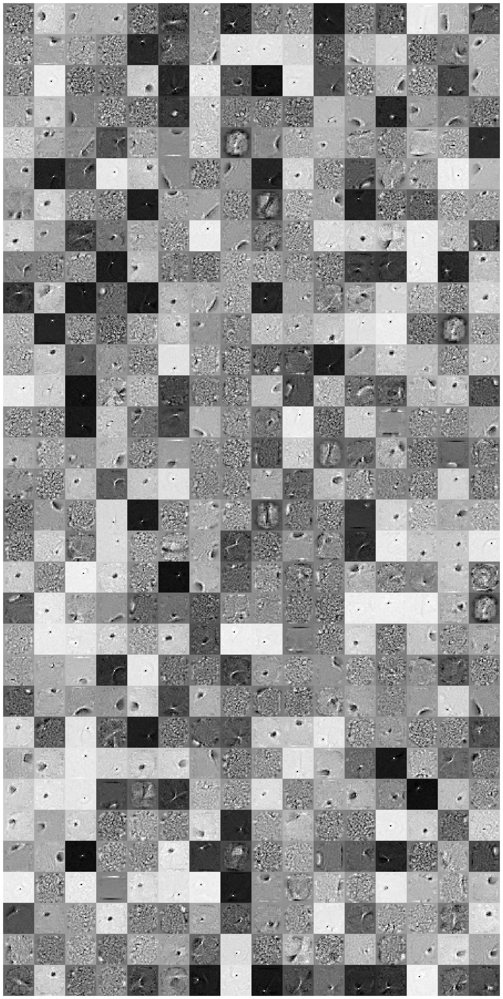

In [206]:
# Visualize all weight filters as images

# Adjust rows and cols based on n_hidden. E.g., 16x16 for 256, 32x16 for 512
rows = 32
cols = 16

fig = plt.figure(figsize=(cols, rows)) 
for i in range(rows * cols):
    ax = fig.add_subplot(rows, cols, i + 1)
    im = ax.imshow(rbm.W[i].detach().cpu().view(p, p), cmap="gray", aspect='auto')
    ax.axis('off')
    
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, top=1, bottom=0)
# cbar = fig.colorbar(im, orientation='horizontal')  #, fraction=0.05, pad=0.02)

plt.show()

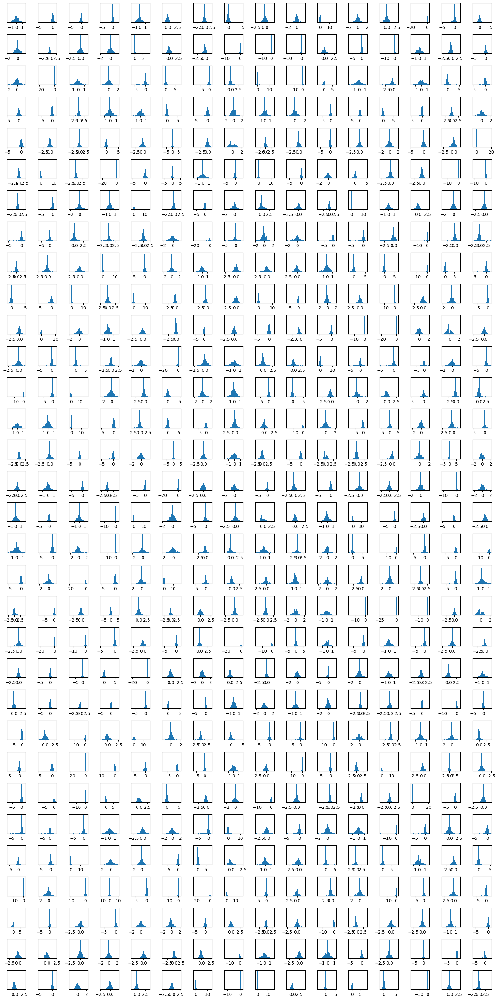

In [207]:
# Plot histograms of weight matrix filters

fig = plt.figure(figsize=(cols, rows)) 
for i in range(rows * cols): 
    ax = fig.add_subplot(rows, cols, i + 1)
    ax.hist(rbm.W[i].detach().cpu().view(-1), bins=50)
    # ax.axis('off')
    # ax.set_xlim(-4,4)
    # ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
plt.show()

# The End